In [2]:
#duplicate images folder to seperate augmented image data

import shutil
import os

def duplicate_folder(source_folder, destination_folder):
    """
    duplicate folfder

    Parameters:
        source_folder (str): Path to the original folder.
        destination_folder (str): Path to the duplicated folder.
    """
    try:
        if os.path.exists(destination_folder):
            print(f"Destination folder '{destination_folder}' already exists. Choose a different name or delete it first.")
        else:
            shutil.copytree(source_folder, destination_folder)
            print(f"Folder duplicated successfully from '{source_folder}' to '{destination_folder}'.")
    except Exception as e:
        print(f"Error duplicating folder: {e}")

# Example usage
source = "images"              # original images
destination = "augimages"    # new folder with duplicated images

duplicate_folder(source, destination)

Folder duplicated successfully from 'images' to 'augimages'.


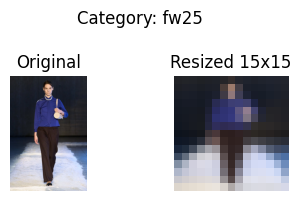

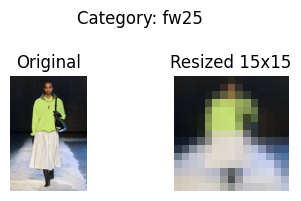

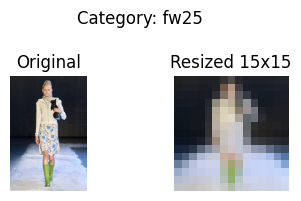

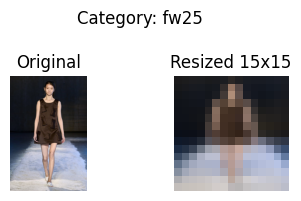

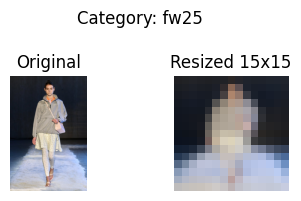

Data shape: (589, 675)
Labels shape: (589,)
Augmented train data shape: (2826, 675)
88.13559322033898% of samples were correctly classified using SVM + Augmented Data


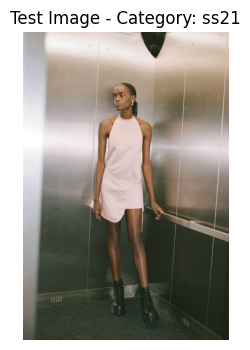

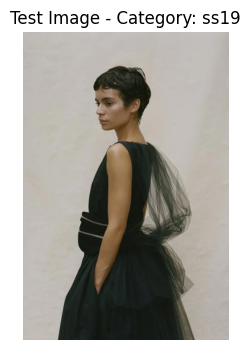

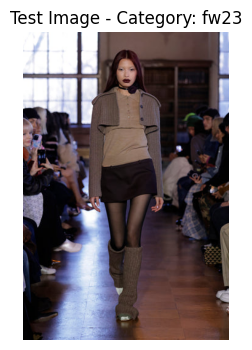

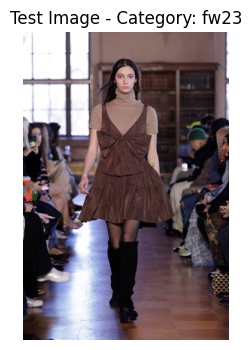

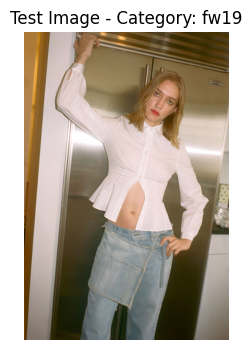

In [58]:
import os
import numpy as np
import pandas as pd
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import pickle
import matplotlib.pyplot as plt
import imgaug.augmenters as iaa

# Prepare data
folder = 'augimages'
input_dir = folder
categories = ['fw25', 'ss25', 'r25', 'fw24', 'ss24', 'r24', 'fw23', 'ss23', 'fw22', 'ss22', 'r22','fw21', 'ss21', 'ss20', 'r20', 'fw20', 'fw19', 'ss19', 'r19']

data = []
labels = []

image_extensions = ('.jpg')
visualize_limit = 5  # number of sample images to visualize
visualized = 0

# augmentation 
augmenter = iaa.Sequential([
    iaa.Fliplr(0.5),                    # 50% chance horizontal flip
    iaa.Affine(rotate=(-15, 15)),        # random small rotation
    iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}), # small translation
    iaa.Affine(scale=(0.9, 1.1))         # small zoom
])

# load training data
for category_idx, category in enumerate(categories):
    category_path = os.path.join(input_dir, category)
    if not os.path.exists(category_path):
        print(f"Warning: Category folder '{category_path}' not found. Skipping.")
        continue

    for file in os.listdir(category_path):
        if not file.lower().endswith(image_extensions):
            continue 

        img_path = os.path.join(category_path, file)
        try:
            img = imread(img_path)
            resized_img = resize(img, (15, 15), anti_aliasing=True)
            data.append(resized_img.flatten())
            labels.append(category_idx)

            # visualize
            if visualized < visualize_limit:
                plt.figure(figsize=(4, 2))
                plt.subplot(1, 2, 1)
                plt.imshow(img)
                plt.title("Original")
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.imshow(resized_img)
                plt.title("Resized 15x15")
                plt.axis('off')

                plt.suptitle(f"Category: {category}")
                plt.tight_layout()
                plt.show()
                visualized += 1
        except Exception as e:
            print(f"Error reading image {img_path}: {e}")

data = np.asarray(data)
labels = np.asarray(labels)

print("Data shape:", data.shape)
print("Labels shape:", labels.shape)

# train/test split
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, shuffle=True, stratify=labels)


n_augmentations = 5  # 5 augmentations per image

augmented_x_train = []
augmented_y_train = []

for i in range(len(x_train)):
    img = x_train[i].reshape(15, 15, 3)
    
    # append the original image
    augmented_x_train.append(img.flatten())
    augmented_y_train.append(y_train[i])
    
    # append multiple augmented versions
    for _ in range(n_augmentations):
        img_aug = augmenter(image=img)
        augmented_x_train.append(img_aug.flatten())
        augmented_y_train.append(y_train[i])

augmented_x_train = np.array(augmented_x_train)
augmented_y_train = np.array(augmented_y_train)

print(f"Augmented train data shape: {augmented_x_train.shape}")

# train classifier
classifier = SVC()
parameters = [{'gamma': [0.01, 0.001, 0.0001], 'C': [1, 10, 100, 1000]}]

grid_search = GridSearchCV(classifier, parameters)
grid_search.fit(augmented_x_train, augmented_y_train)

# evaluate
best_estimator = grid_search.best_estimator_
y_prediction = best_estimator.predict(x_test)

score = accuracy_score(y_prediction, y_test)
print('{}% of samples were correctly classified using SVM + Augmented Data'.format(str(score * 100)))

# save model
pickle.dump(best_estimator, open('./imgclass', 'wb'))

# visualize test images - prove they are original images
num_images_to_show = 5  
for i in range(min(num_images_to_show, len(x_test))):
    label = y_test[i]
    category = categories[label]
    
    category_path = os.path.join(folder, category)
    
    image_files = [f for f in os.listdir(category_path) if f.lower().endswith(image_extensions)]
    
    img_path = os.path.join(category_path, image_files[i % len(image_files)])  # Cycle through if necessary
    
    img = imread(img_path)
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title(f'Test Image - Category: {category}')
    plt.axis('off')
    plt.show()


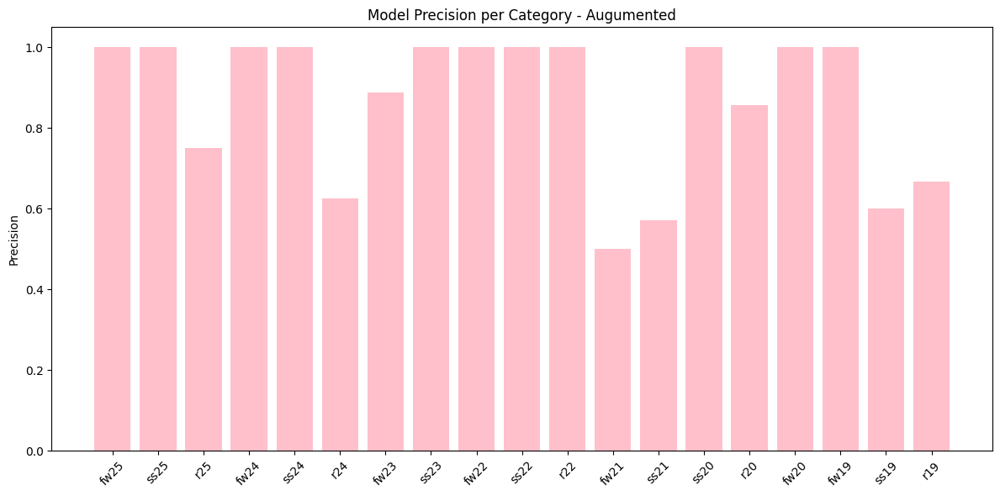

In [60]:
# model precision plot
from sklearn.metrics import classification_report

report = classification_report(y_test, y_prediction, output_dict=True)
accuracies = [report[str(i)]['precision'] for i in np.unique(y_test)]

plt.figure(figsize=(12, 6))
plt.bar([categories[i] for i in np.unique(y_test)], accuracies, color='pink')
plt.xticks(rotation=45)
plt.ylabel("Precision")
plt.title("Model Precision per Category - Augumented")
plt.tight_layout()
plt.show()


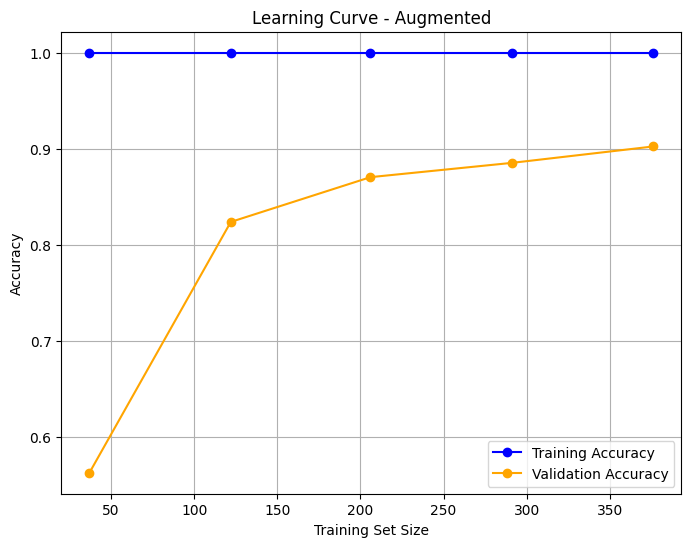

In [59]:
# learning curve plot 

from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    best_estimator, x_train, y_train, cv=5, scoring='accuracy', train_sizes=np.linspace(0.1, 1.0, 5)
)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(8,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Accuracy')
plt.plot(train_sizes, test_scores_mean, 'o-', color='orange', label='Validation Accuracy')
plt.title('Learning Curve - Augmented')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.grid()
plt.show()


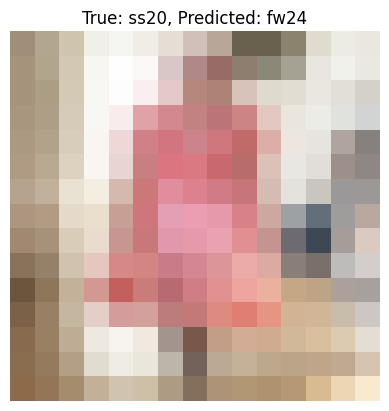

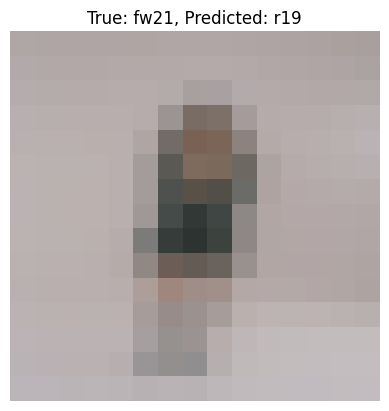

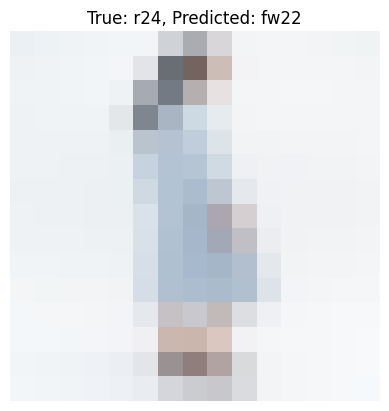

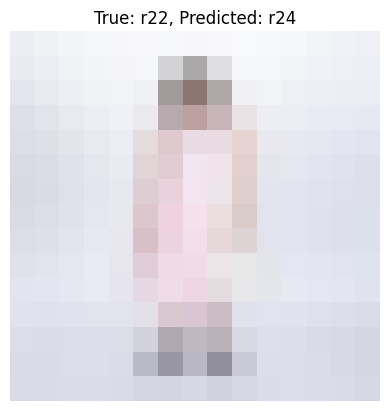

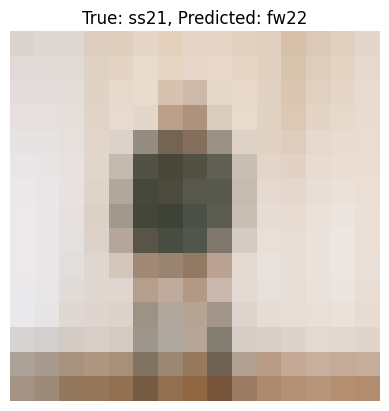

In [49]:
# examples of misclassified images 
misclassified_indices = np.where(y_prediction != y_test)[0]

for idx in misclassified_indices[:5]:  # Show first 5 mistakes
    img = x_test[idx].reshape(15, 15, 3)
    plt.imshow(img)
    plt.title(f"True: {categories[y_test[idx]]}, Predicted: {categories[y_prediction[idx]]}")
    plt.axis('off')
    plt.show()


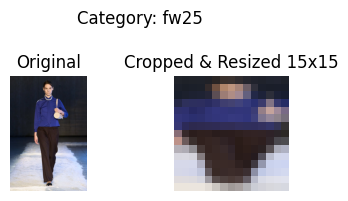

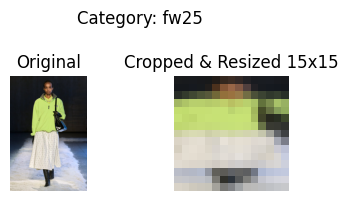

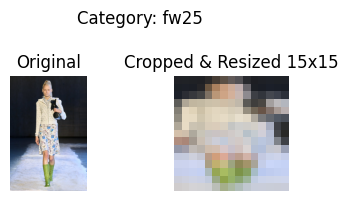

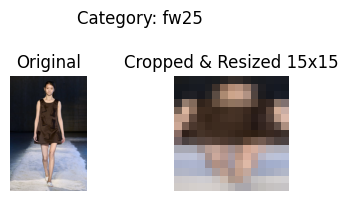

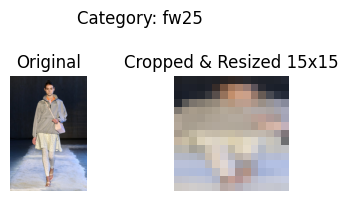

Data shape: (589, 675)
Labels shape: (589,)
Augmented train data shape: (2826, 675)
72.88% of samples were correctly classified using SVM + Augmented Data


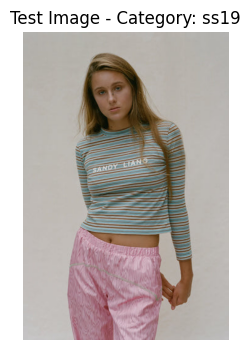

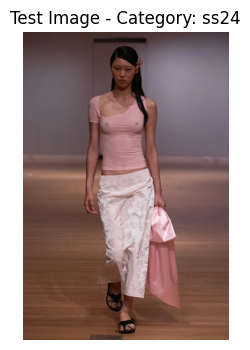

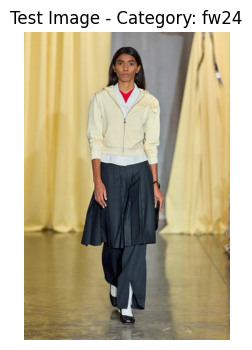

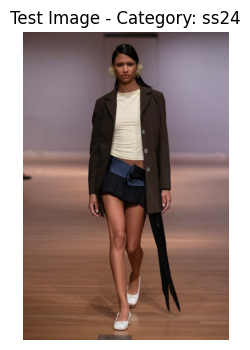

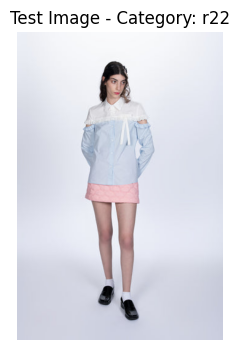

In [8]:
import os
import numpy as np
import pandas as pd
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import pickle
import matplotlib.pyplot as plt
import imgaug.augmenters as iaa

# Prepare data
folder = 'augimages'
categories = ['fw25', 'ss25', 'r25', 'fw24', 'ss24', 'r24', 'fw23', 'ss23', 'fw22', 'ss22', 'r22',
              'fw21', 'ss21', 'ss20', 'r20', 'fw20', 'fw19', 'ss19', 'r19']

data = []
labels = []

image_extensions = ('.jpg')
visualize_limit = 5
visualized = 0

# define augmentation
augmenter = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Affine(rotate=(-15, 15)),
    iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}),
    iaa.Affine(scale=(0.9, 1.1))
])

# crop to middle
def crop_middle_third_before_resize(img, output_size=(15, 15)):
    height, width, _ = img.shape
    start = width // 3
    end = 2 * width // 3
    cropped_img = img[:, start:end]
    return resize(cropped_img, output_size, anti_aliasing=True)

# load training data
for category_idx, category in enumerate(categories):
    category_path = os.path.join(folder, category)
    if not os.path.exists(category_path):
        print(f"Warning: Category folder '{category_path}' not found. Skipping.")
        continue

    for file in os.listdir(category_path):
        if not file.lower().endswith(image_extensions):
            continue

        img_path = os.path.join(category_path, file)
        try:
            img = imread(img_path)
            resized_img = crop_middle_third_before_resize(img)
            data.append(resized_img.flatten())
            labels.append(category_idx)

            if visualized < visualize_limit:
                plt.figure(figsize=(4, 2))
                plt.subplot(1, 2, 1)
                plt.imshow(img)
                plt.title("Original")
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.imshow(resized_img)
                plt.title("Cropped & Resized 15x15")
                plt.axis('off')

                plt.suptitle(f"Category: {category}")
                plt.tight_layout()
                plt.show()
                visualized += 1
        except Exception as e:
            print(f"Error reading image {img_path}: {e}")

data = np.asarray(data)
labels = np.asarray(labels)
print("Data shape:", data.shape)
print("Labels shape:", labels.shape)

# train/test split
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, shuffle=True, stratify=labels)

# data augmentation
n_augmentations = 5
augmented_x_train = []
augmented_y_train = []

for i in range(len(x_train)):
    img = x_train[i].reshape(15, 15, 3)
    augmented_x_train.append(img.flatten())
    augmented_y_train.append(y_train[i])

    for _ in range(n_augmentations):
        img_aug = augmenter(image=(img * 255).astype(np.uint8)) / 255.0
        augmented_x_train.append(img_aug.flatten())
        augmented_y_train.append(y_train[i])

augmented_x_train = np.array(augmented_x_train)
augmented_y_train = np.array(augmented_y_train)
print(f"Augmented train data shape: {augmented_x_train.shape}")

# train classifier
classifier = SVC()
parameters = [{'gamma': [0.01, 0.001, 0.0001], 'C': [1, 10, 100, 1000]}]

grid_search = GridSearchCV(classifier, parameters)
grid_search.fit(augmented_x_train, augmented_y_train)

# evaluate
best_estimator = grid_search.best_estimator_
y_prediction = best_estimator.predict(x_test)
score = accuracy_score(y_prediction, y_test)
print(f'{score * 100:.2f}% of samples were correctly classified using SVM + Augmented Data')

# save model
pickle.dump(best_estimator, open('./imgclass', 'wb'))

# visualize test images
num_images_to_show = 5
for i in range(min(num_images_to_show, len(x_test))):
    label = y_test[i]
    category = categories[label]
    category_path = os.path.join(folder, category)

    image_files = [f for f in os.listdir(category_path) if f.lower().endswith(image_extensions)]
    if not image_files:
        continue

    img_path = os.path.join(category_path, image_files[i % len(image_files)])
    img = imread(img_path)

    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title(f'Test Image - Category: {category}')
    plt.axis('off')
    plt.show()


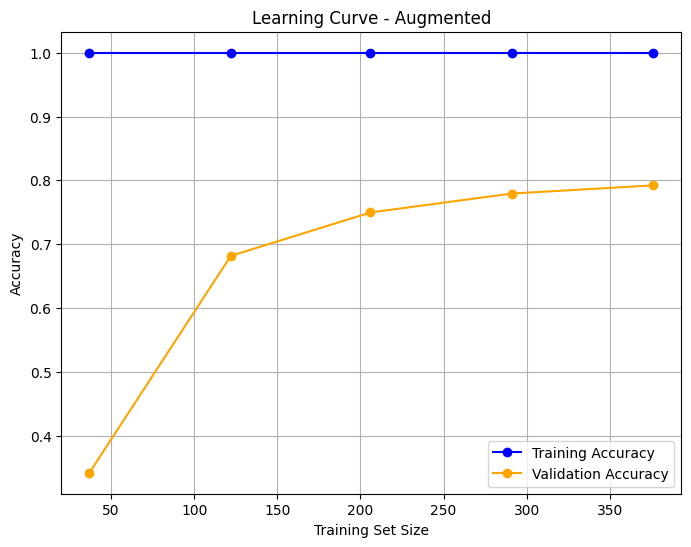

In [9]:
# learning curve plot 

from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    best_estimator, x_train, y_train, cv=5, scoring='accuracy', train_sizes=np.linspace(0.1, 1.0, 5)
)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(8,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training Accuracy')
plt.plot(train_sizes, test_scores_mean, 'o-', color='orange', label='Validation Accuracy')
plt.title('Learning Curve - Augmented')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.grid()
plt.show()


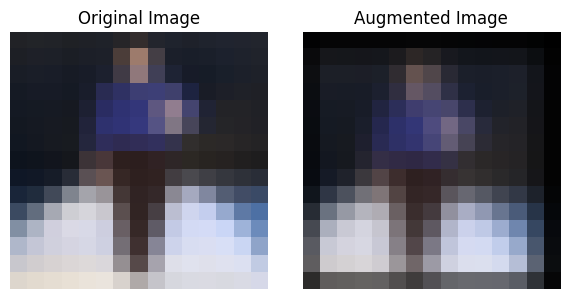

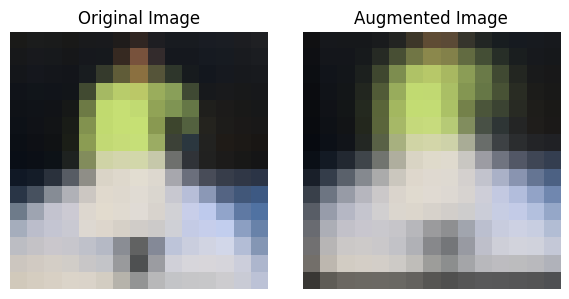

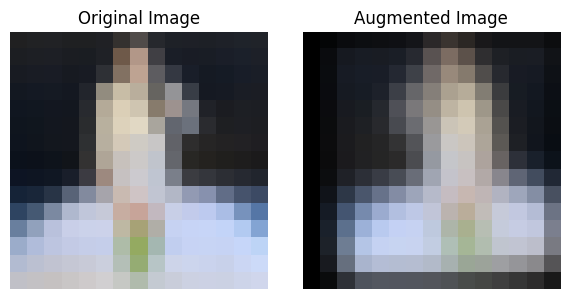

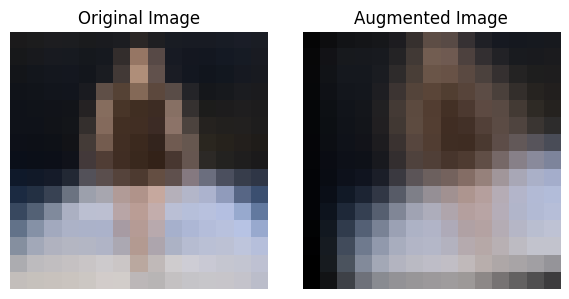

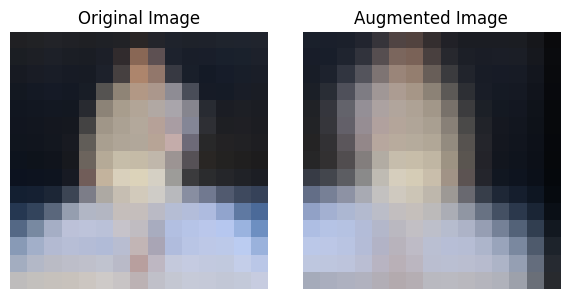

...

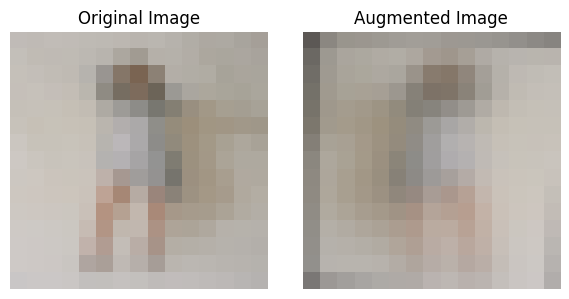

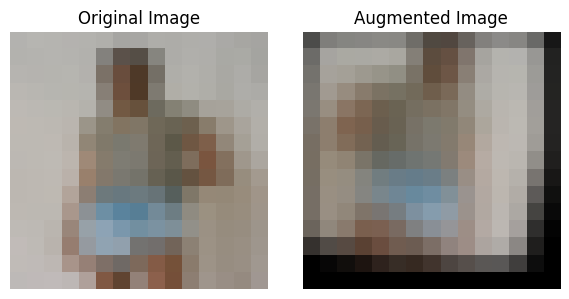

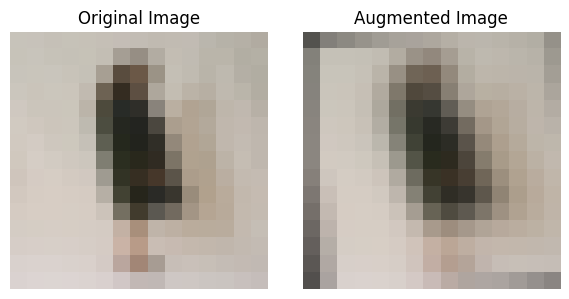

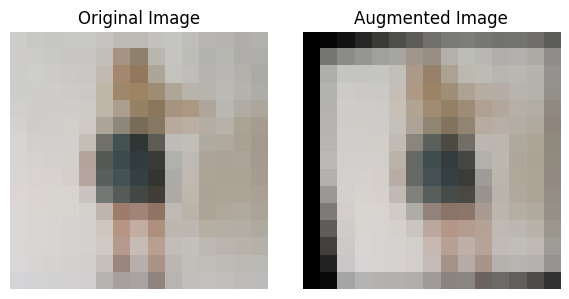

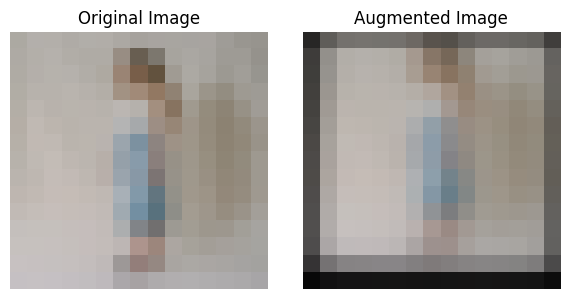

In [1]:
# visualize original vs. augmented images
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
import imgaug.augmenters as iaa

# augmentation guidelines
augmenter = iaa.Sequential([
    iaa.Fliplr(0.5),                    # 50% chance horizontal flip
    iaa.Affine(rotate=(-15, 15)),        # random small rotation
    iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}), # small translation
    iaa.Affine(scale=(0.9, 1.1))         # small zoom
])

# prepare data
folder = 'images' 
categories = ['fw25','ss25','r25','fw24','ss24','r24','fw23','ss23','fw22','ss22','r22','fw21','ss21','ss20','r20','fw20','fw19','ss19','r19']

image_extensions = ('.jpg')
visualize_limit = 5  # number of sample images to visualize
visualized = 0

# Visualize original and augmented images
def visualize_images(original_img, augmented_img):
    plt.figure(figsize=(6, 3))

    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(augmented_img)
    plt.title("Augmented Image")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# apply augmentation
for category_idx, category in enumerate(categories):
    category_path = os.path.join(folder, category)
    if not os.path.exists(category_path):
        print(f"Warning: Category folder '{category_path}' not found. Skipping.")
        continue

    for file in os.listdir(category_path):
        if not file.lower().endswith(image_extensions):
            continue  # Skip non-image files

        img_path = os.path.join(category_path, file)
        try:
            # Read the image
            img = imread(img_path)
            resized_img = resize(img, (15, 15), anti_aliasing=True)  # resize to 15x15

            # Augment the image
            img_aug = augmenter(image=(resized_img * 255).astype(np.uint8))
            img_aug = img_aug / 255.0  # Normalize back to [0, 1]

            # visualize original and augmented images
            if visualized < visualize_limit:
                visualize_images(resized_img, img_aug)  

        except Exception as e:
            print(f"Error reading image {img_path}: {e}")


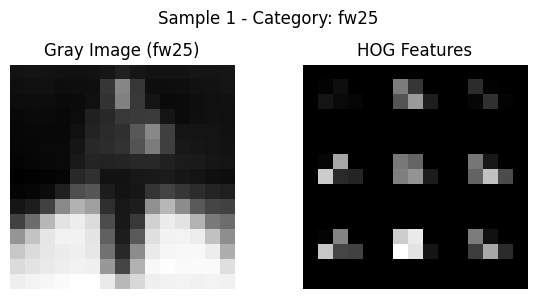

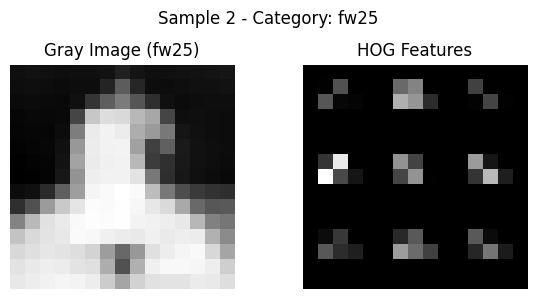

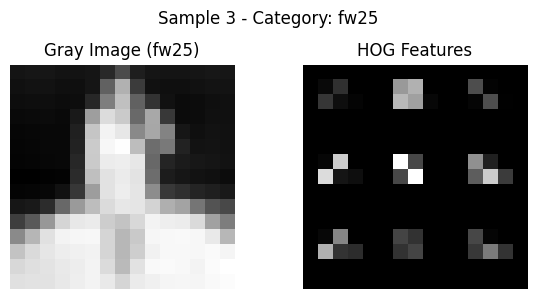

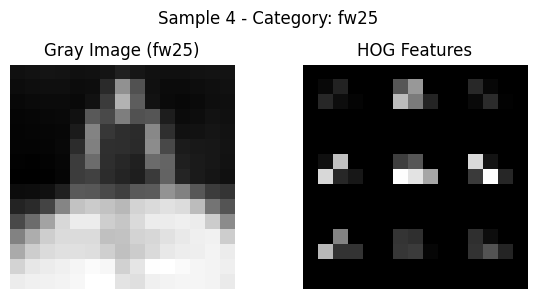

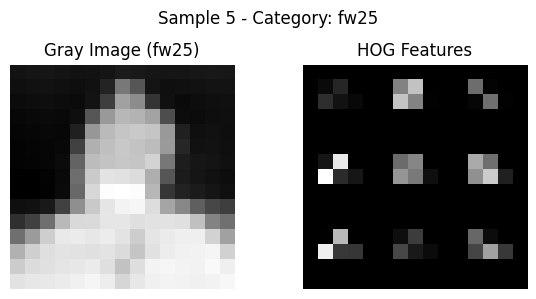

HOG Feature shape: (589, 81)
Labels shape: (589,)
74.57627118644068% of samples were correctly classified using HOG + SVM + Augmented Data


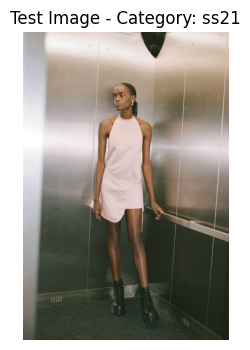

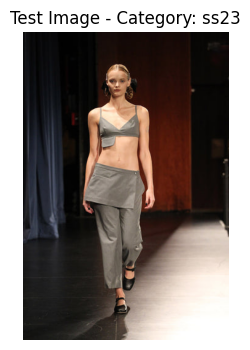

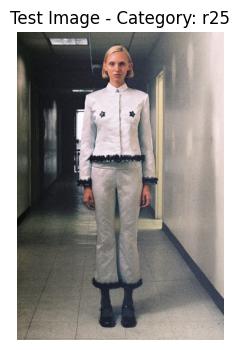

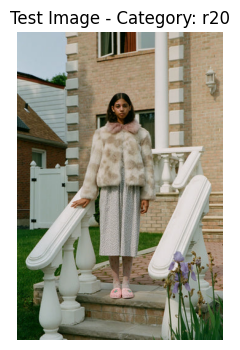

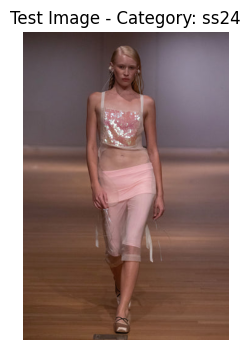

In [42]:
import os
import numpy as np
import pandas as pd
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
from skimage.feature import hog
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import pickle
import matplotlib.pyplot as plt
import imgaug.augmenters as iaa

# Augmentation guidelines
augmenter = iaa.Sequential([
    iaa.Fliplr(0.5),                    # 50% chance horizontal flip
    iaa.Affine(rotate=(-15, 15)),        # random small rotation
    iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}), # small translation
    iaa.Affine(scale=(0.9, 1.1))         # small zoom
])

# Prepare data
folder = 'augimages'
categories = ['fw25','ss25','r25','fw24','ss24','r24','fw23','ss23','fw22','ss22','r22','fw21','ss21','ss20','r20','fw20','fw19','ss19','r19']

data = []
labels = []

image_extensions = ('.jpg')

# Visualization
visualize_limit = 5  # show HOG for first 5 images
visualized = 0

# Loop through categories and apply augmentation
for category_idx, category in enumerate(categories):
    category_path = os.path.join(folder, category)
    if not os.path.exists(category_path):
        print(f"Warning: Category folder '{category_path}' not found. Skipping.")
        continue

    for file in os.listdir(category_path):
        if not file.lower().endswith(image_extensions):
            continue

        # HOG feature extraction
        img_path = os.path.join(category_path, file)
        try:
            img = imread(img_path)
            img = resize(img, (15, 15), anti_aliasing=True)
            gray = rgb2gray(img)
            hog_features, hog_image = hog(
                gray,
                pixels_per_cell=(5, 5),
                cells_per_block=(1, 1),
                visualize=True,
                feature_vector=True
            )

            # Augment the image for training set
            img_aug = augmenter(image=(gray * 255).astype(np.uint8))
            img_aug = img_aug / 255.0  # Normalize back to [0, 1]

            data.append(hog_features)
            labels.append(category_idx)

            # Visualize HOG features for the first few images
            if visualized < visualize_limit:
                plt.figure(figsize=(6, 3))
                plt.subplot(1, 2, 1)
                plt.imshow(gray, cmap='gray')
                plt.title(f'Gray Image ({category})')
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.imshow(hog_image, cmap='gray')
                plt.title('HOG Features')
                plt.axis('off')

                plt.suptitle(f'Sample {visualized + 1} - Category: {category}')
                plt.tight_layout()
                plt.show()
                visualized += 1

        except Exception as e:
            print(f"Error reading image {img_path}: {e}")

data = np.asarray(data)
labels = np.asarray(labels)

print("HOG Feature shape:", data.shape)
print("Labels shape:", labels.shape)

# Train/test split
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, shuffle=True, stratify=labels)

# Train classifier with GridSearchCV
classifier = SVC()
parameters = [{'gamma': [0.01, 0.001, 0.0001], 'C': [1, 10, 100, 1000]}]

grid_search = GridSearchCV(classifier, parameters)
grid_search.fit(x_train, y_train)

# Test performance on original test data 
best_estimator = grid_search.best_estimator_
y_prediction = best_estimator.predict(x_test)

score = accuracy_score(y_prediction, y_test)
print('{}% of samples were correctly classified using HOG + SVM + Augmented Data'.format(str(score * 100)))

# Save the model
pickle.dump(best_estimator, open('./imgclass_hog_aug', 'wb'))

# Optional: Visualize the images in the test set
num_images_to_show = 5  # Show 5 images from the test set
for i in range(min(num_images_to_show, len(x_test))):
    label = y_test[i]
    category = categories[label]
    
    # Get the file corresponding to this label (same method as for training)
    category_path = os.path.join(folder, category)
    
    # Find the image file corresponding to this label
    image_files = [f for f in os.listdir(category_path) if f.lower().endswith(image_extensions)]
    
    # Get the image file at the same index as in the test set
    img_path = os.path.join(category_path, image_files[i % len(image_files)])  # Cycle through if necessary
    
    # Read and display the image
    img = imread(img_path)
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title(f'Test Image - Category: {category}')
    plt.axis('off')
    plt.show()




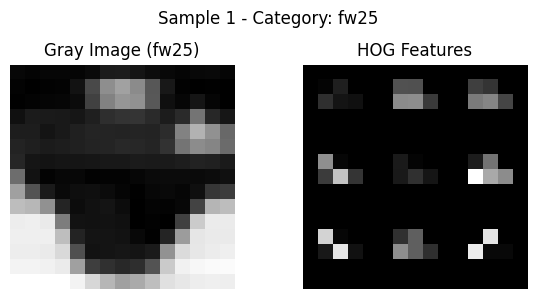

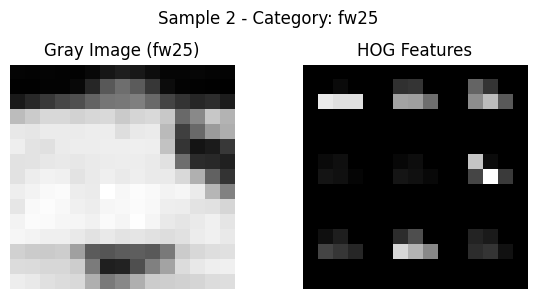

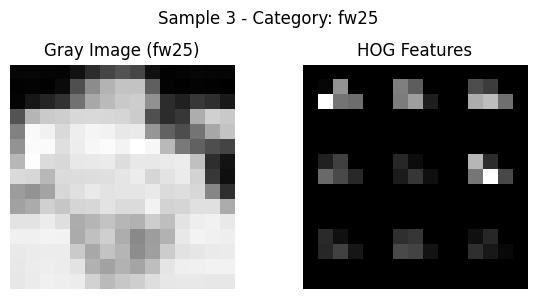

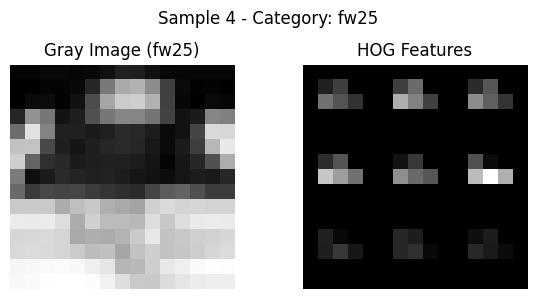

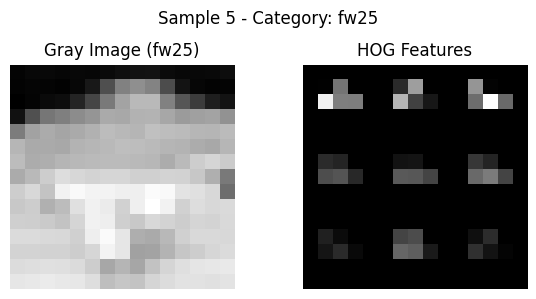

HOG Feature shape: (589, 81)
Labels shape: (589,)
28.81% of samples were correctly classified using HOG + SVM + Augmented Data


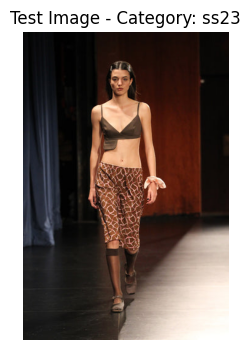

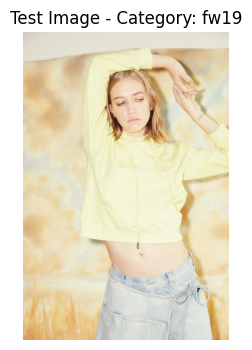

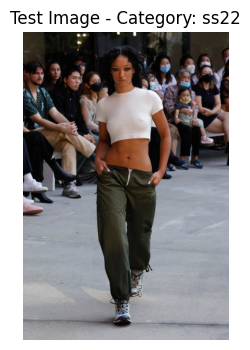

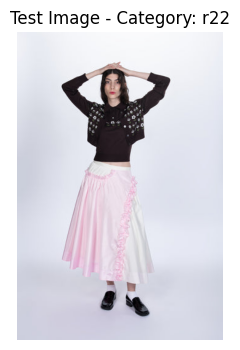

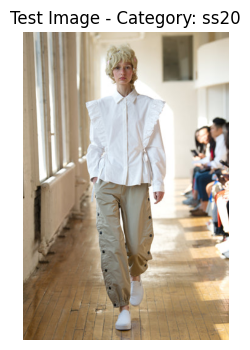

In [6]:
import os
import numpy as np
import pandas as pd
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
from skimage.feature import hog
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import pickle
import matplotlib.pyplot as plt
import imgaug.augmenters as iaa

# augmentation
augmenter = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Affine(rotate=(-15, 15)),
    iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}),
    iaa.Affine(scale=(0.9, 1.1))
])

# crop middle
def crop_middle_third(img):
    height, width, _ = img.shape
    start = width // 3
    end = 2 * width // 3
    return img[:, start:end]

# Prepare data
folder = 'augimages'
categories = ['fw25','ss25','r25','fw24','ss24','r24','fw23','ss23','fw22','ss22','r22',
              'fw21','ss21','ss20','r20','fw20','fw19','ss19','r19']

data = []
labels = []

image_extensions = ('.jpg')
visualize_limit = 5
visualized = 0

# load images
for category_idx, category in enumerate(categories):
    category_path = os.path.join(folder, category)
    if not os.path.exists(category_path):
        print(f"Warning: Category folder '{category_path}' not found. Skipping.")
        continue

    for file in os.listdir(category_path):
        if not file.lower().endswith(image_extensions):
            continue

        img_path = os.path.join(category_path, file)
        try:
            img = imread(img_path)

            # Crop middle third
            img = crop_middle_third(img)

            # Resize and convert to grayscale
            img = resize(img, (15, 15), anti_aliasing=True)
            gray = rgb2gray(img)

            # Extract HOG features
            hog_features, hog_image = hog(
                gray,
                pixels_per_cell=(5, 5),
                cells_per_block=(1, 1),
                visualize=True,
                feature_vector=True
            )

            # augment image
            img_aug = augmenter(image=(gray * 255).astype(np.uint8))
            img_aug = img_aug / 255.0

            data.append(hog_features)
            labels.append(category_idx)

            # visualize hog
            if visualized < visualize_limit:
                plt.figure(figsize=(6, 3))
                plt.subplot(1, 2, 1)
                plt.imshow(gray, cmap='gray')
                plt.title(f'Gray Image ({category})')
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.imshow(hog_image, cmap='gray')
                plt.title('HOG Features')
                plt.axis('off')

                plt.suptitle(f'Sample {visualized + 1} - Category: {category}')
                plt.tight_layout()
                plt.show()
                visualized += 1

        except Exception as e:
            print(f"Error reading image {img_path}: {e}")

data = np.asarray(data)
labels = np.asarray(labels)

print("HOG Feature shape:", data.shape)
print("Labels shape:", labels.shape)

# train/test split
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, shuffle=True, stratify=labels)

# Grid search for SVM
classifier = SVC()
parameters = [{'gamma': [0.01, 0.001, 0.0001], 'C': [1, 10, 100, 1000]}]
grid_search = GridSearchCV(classifier, parameters)
grid_search.fit(x_train, y_train)

# Evaluate on test set
best_estimator = grid_search.best_estimator_
y_prediction = best_estimator.predict(x_test)
score = accuracy_score(y_prediction, y_test)

print(f'{score * 100:.2f}% of samples were correctly classified using HOG + SVM + Augmented Data')

# save model
pickle.dump(best_estimator, open('./imgclass_hog_aug', 'wb'))

# visualize 
num_images_to_show = 5
for i in range(min(num_images_to_show, len(x_test))):
    label = y_test[i]
    category = categories[label]
    category_path = os.path.join(folder, category)

    image_files = [f for f in os.listdir(category_path) if f.lower().endswith(image_extensions)]
    if not image_files:
        continue

    img_path = os.path.join(category_path, image_files[i % len(image_files)])
    img = imread(img_path)

    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title(f'Test Image - Category: {category}')
    plt.axis('off')
    plt.show()
